<a href="https://colab.research.google.com/github/DevSingh28/Loan-Approval-System/blob/main/Loan_approval.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping

In [37]:
df = pd.read_csv('loan_approval_dataset.csv')

In [38]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   loan_id                    4269 non-null   int64 
 1    no_of_dependents          4269 non-null   int64 
 2    education                 4269 non-null   object
 3    self_employed             4269 non-null   object
 4    income_annum              4269 non-null   int64 
 5    loan_amount               4269 non-null   int64 
 6    loan_term                 4269 non-null   int64 
 7    cibil_score               4269 non-null   int64 
 8    residential_assets_value  4269 non-null   int64 
 9    commercial_assets_value   4269 non-null   int64 
 10   luxury_assets_value       4269 non-null   int64 
 11   bank_asset_value          4269 non-null   int64 
 12   loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [40]:
df.shape

(4269, 13)

In [41]:
df.columns

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

In [42]:
df.isna().values.any()

False

In [43]:
df[' cibil_score'].nunique()

601

In [44]:
df = df.rename(columns={' cibil_score': 'cibil_score'})

<Axes: xlabel=' loan_status', ylabel='cibil_score'>

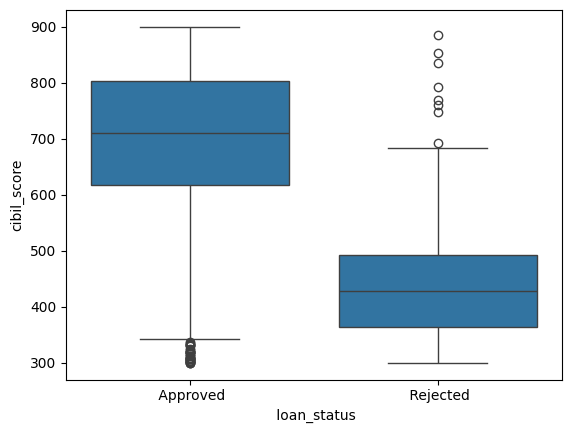

In [45]:
sns.boxplot(data=df, y='cibil_score', x=' loan_status')

<Axes: xlabel=' education', ylabel='cibil_score'>

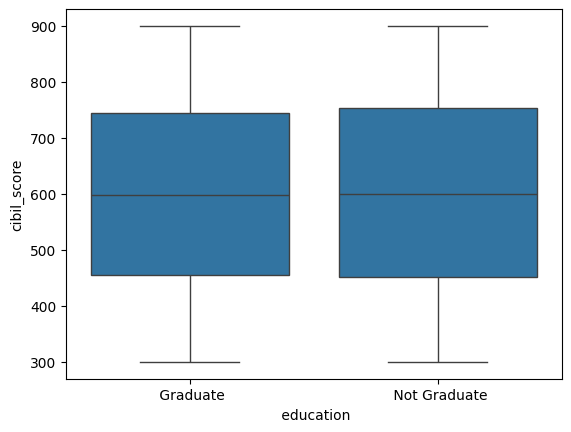

In [46]:
sns.boxplot(data=df, y='cibil_score', x=' education')

In [47]:
df.groupby(' education').count()[' loan_status']

 education
 Graduate        2144
 Not Graduate    2125
Name:  loan_status, dtype: int64

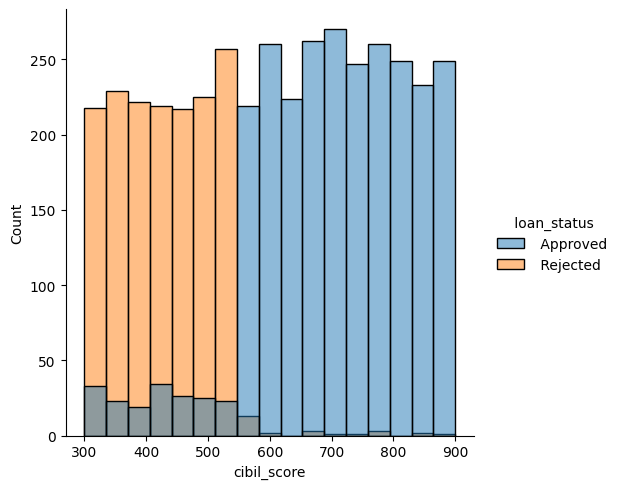

In [48]:
sns.displot(df, x='cibil_score', hue=' loan_status')

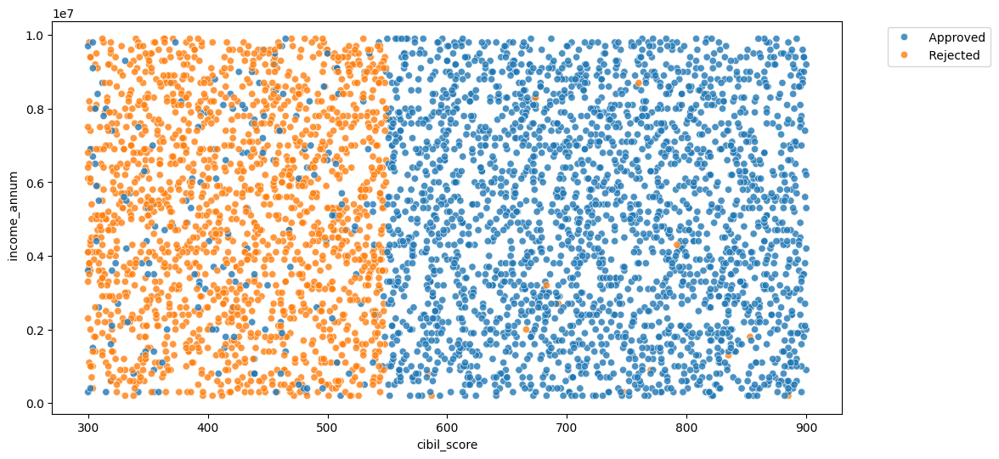

In [49]:
plt.figure(figsize=(12,6))
sns.scatterplot(df, x='cibil_score', y=' income_annum', hue=' loan_status', alpha=0.8)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

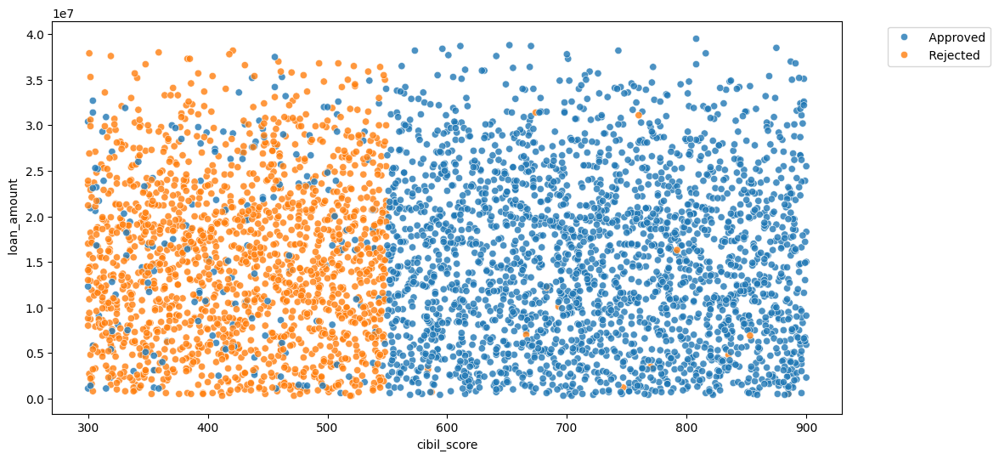

In [50]:
plt.figure(figsize=(12,6))
sns.scatterplot(df, x='cibil_score', y=' loan_amount', hue=' loan_status', alpha=0.8)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [51]:
df[df[' education'] == ' Graduate'][' self_employed'].value_counts()

 self_employed
 No     1089
 Yes    1055
Name: count, dtype: int64

In [52]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [53]:
df.shape

(4269, 13)

In [54]:
df.columns

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', 'cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

In [55]:
df = pd.get_dummies(df, columns=[' loan_status'], drop_first=True)

In [56]:
lis = [' loan_status_ Rejected']
for i in lis:
  df[i] = df[i].astype(int)

In [57]:
df = pd.get_dummies(df, columns=[' education'], drop_first=True)

In [58]:
lis = [' education_ Not Graduate']
for i in lis:
  df[i] = df[i].astype(int)

In [59]:
df = pd.get_dummies(df, columns=[' self_employed'], drop_first=True)

In [60]:
lis = [' self_employed_ Yes']
for i in lis:
  df[i] = df[i].astype(int)

In [61]:
df.drop('loan_id', axis=1, inplace=True)

In [62]:
X = df.drop(' loan_status_ Rejected', axis=1).values
y = df[' loan_status_ Rejected'].values

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [64]:
from sklearn.preprocessing import MinMaxScaler

In [65]:
scaler = MinMaxScaler()

In [66]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [67]:
model = Sequential()
model.add(Dense(12, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(6, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam')

In [68]:
early = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

In [69]:
%load_ext tensorboard

In [70]:
from datetime import datetime as dt

In [71]:
date = dt.now().strftime('%y-%m-%d--%H%M')
log_directory = 'logs'

In [72]:
board = TensorBoard(log_directory, histogram_freq=1, profile_batch=2)

In [73]:
model.fit(x=X_train, y=y_train, batch_size=256, epochs=50, validation_data=(X_test, y_test), callbacks=[early, board])

Epoch 1/50
14/14 [==============================] - 2s 32ms/step - loss: 0.6854 - val_loss: 0.6642
Epoch 2/50
14/14 [==============================] - 0s 11ms/step - loss: 0.6744 - val_loss: 0.6599
Epoch 3/50
14/14 [==============================] - 0s 11ms/step - loss: 0.6706 - val_loss: 0.6553
Epoch 4/50
14/14 [==============================] - 0s 12ms/step - loss: 0.6694 - val_loss: 0.6526
Epoch 5/50
14/14 [==============================] - 0s 13ms/step - loss: 0.6617 - val_loss: 0.6494
Epoch 6/50
14/14 [==============================] - 0s 11ms/step - loss: 0.6598 - val_loss: 0.6456
Epoch 7/50
14/14 [==============================] - 0s 11ms/step - loss: 0.6527 - val_loss: 0.6420
Epoch 8/50
14/14 [==============================] - 0s 10ms/step - loss: 0.6511 - val_loss: 0.6371
Epoch 9/50
14/14 [==============================] - 0s 12ms/step - loss: 0.6492 - val_loss: 0.6326
Epoch 10/50
14/14 [==============================] - 0s 9ms/step - loss: 0.6488 - val_loss: 0.6282
Epoch 11/5

In [74]:
df2 = pd.DataFrame(model.history.history)

In [75]:
df2.head()

,loss,val_loss
0,0.685448,0.664156
1,0.674362,0.659924
2,0.670592,0.655328
3,0.669413,0.652576
4,0.661681,0.649378


<Axes: >

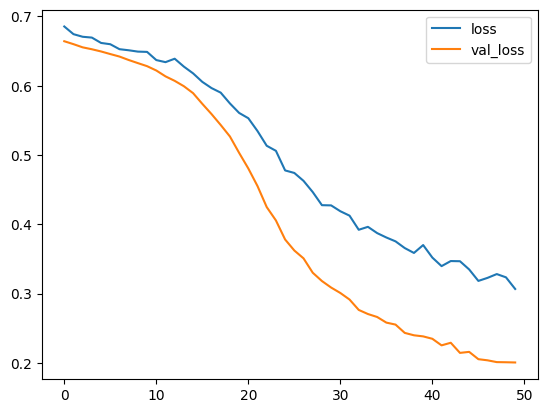

In [76]:
df2.plot()

In [77]:
pred = model.predict(X_test)

27/27 [==============================] - 0s 2ms/step


In [78]:
predictions=np.round(pred).astype(int)

In [79]:
print(confusion_matrix(y_test, predictions))

[[498  41]
 [ 10 305]]


In [80]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.98      0.92      0.95       539
           1       0.88      0.97      0.92       315

    accuracy                           0.94       854
   macro avg       0.93      0.95      0.94       854
weighted avg       0.94      0.94      0.94       854



In [81]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [82]:
df.head()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status_ Rejected,education_ Not Graduate,self_employed_ Yes
0,2,9600000,29900000,12,778,2400000,17600000,22700000,8000000,0,0,0
1,0,4100000,12200000,8,417,2700000,2200000,8800000,3300000,1,1,1
2,3,9100000,29700000,20,506,7100000,4500000,33300000,12800000,1,0,0
3,3,8200000,30700000,8,467,18200000,3300000,23300000,7900000,1,0,0
4,5,9800000,24200000,20,382,12400000,8200000,29400000,5000000,1,1,1


In [83]:
new_customer2 = df.drop(' loan_status_ Rejected',axis=1).iloc[0]
new_customer2

 no_of_dependents                   2
 income_annum                 9600000
 loan_amount                 29900000
 loan_term                         12
cibil_score                       778
 residential_assets_value     2400000
 commercial_assets_value     17600000
 luxury_assets_value         22700000
 bank_asset_value             8000000
 education_ Not Graduate            0
 self_employed_ Yes                 0
Name: 0, dtype: int64

In [84]:
new_customer2.shape

(11,)

In [85]:
new_customer2 = new_customer2.values.reshape(1,11)

In [86]:
new_customer2.shape

(1, 11)

In [87]:
X_train.shape

(3415, 11)

In [88]:
cus_pred2 = model.predict(new_customer2)

1/1 [==============================] - 0s 68ms/step


In [89]:
loan_yes_or_no = np.round(cus_pred2).astype(int)
if loan_yes_or_no == 0:
  print('Not Approved')
else:
  print('Approved')

Not Approved


In [90]:
columns = ['no_of_dependents', 'income_annum', 'loan_amount', 'loan_term',
           'cibil_score', 'residential_assets_value', 'commercial_assets_value',
           'luxury_assets_value', 'bank_asset_value', 'education_Not Graduate', 'self_employed_Yes']

user_inputs = []
for column in columns:
    user_input = input(f"Enter value for {column}: ")
    user_inputs.append(user_input)


Enter value for no_of_dependents: 2
Enter value for income_annum: 25000
Enter value for loan_amount: 20000
Enter value for loan_term: 8
Enter value for cibil_score: 900
Enter value for residential_assets_value: 34500
Enter value for commercial_assets_value: 23000
Enter value for luxury_assets_value: 56000
Enter value for bank_asset_value: 20000
Enter value for education_Not Graduate: 1
Enter value for self_employed_Yes: 1


In [101]:
user_inputs_2d = np.array(user_inputs).reshape(1, 11)

In [92]:
user_inputs_2d.shape

(1, 11)

In [93]:
new_customer = scaler.transform(user_inputs_2d)

In [94]:
pred = model.predict(new_customer)

1/1 [==============================] - 0s 20ms/step


In [95]:
prediction = np.round(pred).astype(int)
if prediction == 0:
  print('Not Approved')
else:
  print('Approved')

Not Approved


In [96]:
columns = ['no_of_dependents', 'income_annum', 'loan_amount', 'loan_term',
           'cibil_score', 'residential_assets_value', 'commercial_assets_value',
           'luxury_assets_value', 'bank_asset_value', 'education_Not Graduate', 'self_employed_Yes']

user_inputs = []
for column in columns:
    user_input = input(f"Enter value for {column}: ")
    user_inputs.append(user_input)

Enter value for no_of_dependents: 1
Enter value for income_annum: 10000000000
Enter value for loan_amount: 10
Enter value for loan_term: 10
Enter value for cibil_score: 10
Enter value for residential_assets_value: 10
Enter value for commercial_assets_value: 10
Enter value for luxury_assets_value: 10
Enter value for bank_asset_value: 10
Enter value for education_Not Graduate: 10
Enter value for self_employed_Yes: 1


In [97]:
user_inputs_2d = np.array(user_inputs).reshape(1, 11)

In [98]:
new_customer = scaler.transform(user_inputs_2d)

In [99]:
pred = model.predict(new_customer)

1/1 [==============================] - 0s 21ms/step


In [100]:
prediction = np.round(pred).astype(int)
if prediction == 0:
  print('Not Approved')
else:
  print('Approved')

Not Approved
